### Carlos LESMES

In [15]:
using WebIO
using Dates
Dates.format(now(), "E, dd U yyyy HH:MM:SS")

"Wednesday, 22 June 2022 21:42:56"

In [16]:
using Random, StatsBase, Distributions, LaTeXStrings, StatsPlots

#  Generación de números aleatorios
Una forma de generar números aleatorios es utilizando congruencias lineales de la forma:
$$ \color{blue}r_{i+1} \equiv ar_{i}+b \quad \mod d$$
para enteros $a>0$, $b\ge0$ y $d>0$, *mod* es abreviatura de módulo, significa que $r_{i+1}$ es el residuo de $ ar_{i}+b $ bajo división por d. Aquí, $a$ se llama el **multiplicador**, b el **incremento**, d el **módulo** del generador y $r_0$ se llama la **semilla**. Estrictamente hablando no se pueden construir números totalmente aleatorios; en el caso de las congruencias el primer número (la semilla) se puede escoger, pero los siguientes están determinados, por eso se habla de este proceso como un generador de números **pseudo-aleatorios**.
##  Ejemplo
1 es congruente con  7 módulo 3, se escribe:
$$ 1 \equiv 7 \mod 3 $$
En julia se usa la función `%`.

In [17]:
7 % 3

1

1 es el residuo de dividir 7 en 3

Una función en Julia para generar números aleatorios utilizando el generador de congruencias lineales:

In [18]:
function gcl(n::Integer, a::Integer, b::Integer, d::Integer,s::Integer)
    x = Array{Float64, 1}(UndefInitializer(), n)
    x[1] = s
    for i ∈ 1:(n-1)
        x[i+1] = (a * x[i] +b) % d
    end
    u = x ./d
end

gcl (generic function with 1 method)

Definitivamente la escogencia de a, b y d será crucial para obtener un buen generador. Veamos el siguiente ejemplo:

In [19]:
a = 7^12
b = 0
d = 2^31-1
n = 10^4
s=1
u = gcl(n, a, b, d,s);

Las gráficas a continuación muestran el histograma de los números generados a la izquierda y un diagrama de dispersión de los 

┌ Warning: ORCA.jl has been deprecated and all savefig functionality
│ has been implemented directly in PlotlyBase itself.
│ 
│ By implementing in PlotlyBase.jl, the savefig routines are automatically
│ available to PlotlyJS.jl also.
└ @ ORCA /Users/carloslesmes/.julia/packages/ORCA/U5XaN/src/ORCA.jl:8


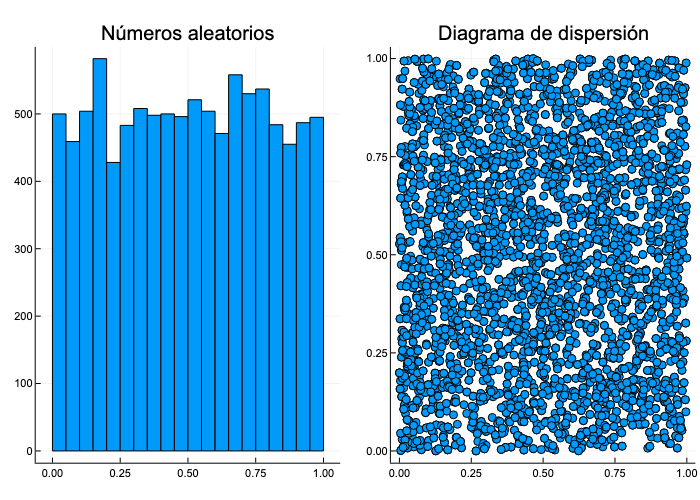

In [20]:
using Plots
plotlyjs()
p1 = histogram(u, leg=false, title="Números aleatorios")
p2 = plot(u[2:2:9999],u[3:2:10000], st=:scatter, leg=false, title="Diagrama de dispersión")
plot(p1,p2,layout=(1,2))

In [21]:
autocor(u,[1])

1-element Vector{Float64}:
 0.023816250364572522

In [22]:
a = 1093
b = 18257
d = 86436
n = 1000
s=7
u = gcl(n, a, b, d,s);

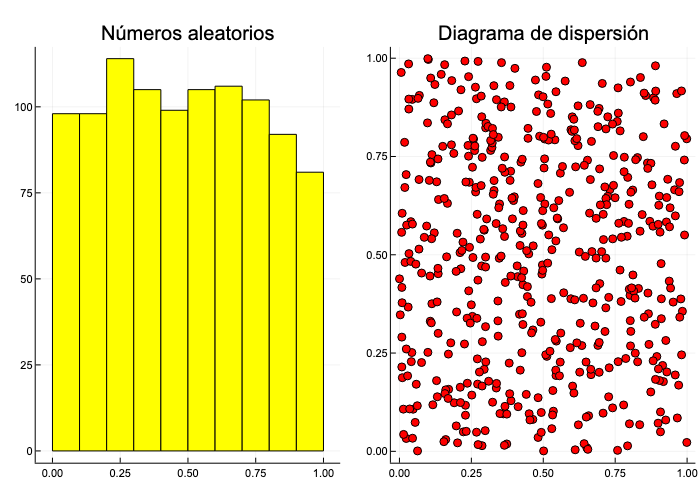

In [23]:
p3 = histogram(u, leg=false, title="Números aleatorios",color=:yellow)
p4 = plot(u[2:2:999],u[3:2:1000], st=:scatter, leg=false, title="Diagrama de dispersión",color=:red)
plot(p3,p4,layout=(1,2))

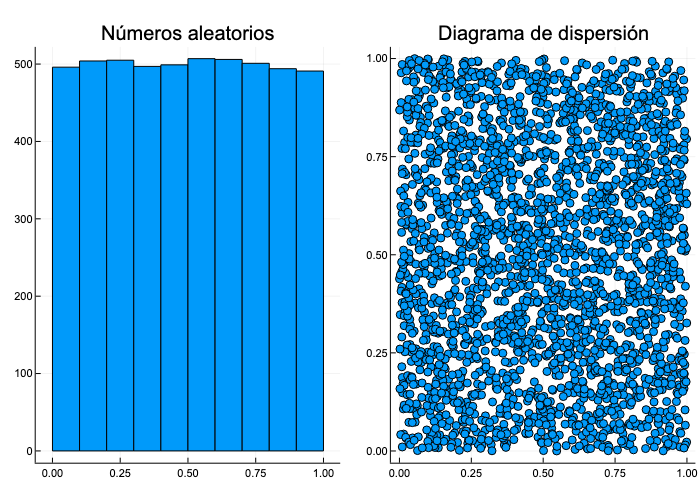

In [24]:
a = 1093
b = 18257
d = 86436
n = 5000
s=7
u = gcl(n, a, b, d,s);
p5 = histogram(u, leg=false, title="Números aleatorios")
p6 = plot(u[2:2:4999],u[3:2:5000], st=:scatter, leg=false, title="Diagrama de dispersión")
plot(p5,p6,layout=(1,2))

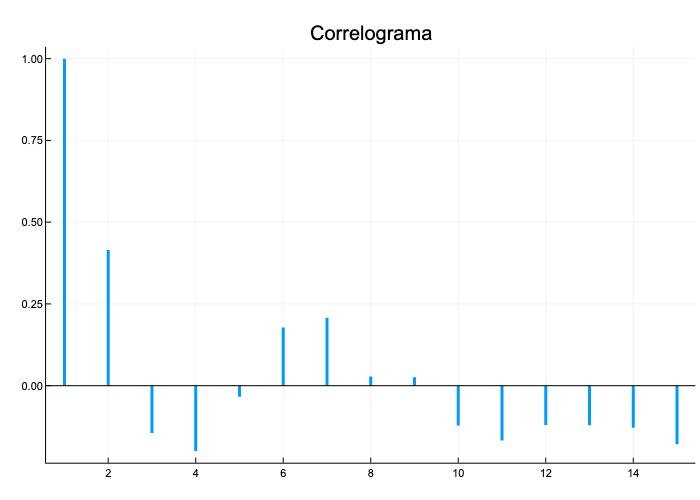

In [25]:
u1 = rand(25)
au = autocor(u1)
plot(au, st=:sticks,title="Correlograma",leg=false,lw=3)
hline!([0],color=:black)

In [26]:
autocor(u1,[1])

1-element Vector{Float64}:
 0.41475149261442373

# Números aleatorios de las distribuciones de probabilidad
Julia utiliza por defecto el algorítmo `Xoshiro256++` que es más sofisticado que el algorítmo  de las congruencias lineales, vea [aquí](https://prng.di.unimi.it) para más detalles. El paquete `Random` permite el soporte de otros algorítmos como el de **MersenneTwister** y permite el uso de las funciones `rand`, `randn` y `randstring` que generan números aleatorios uniformes, normales, y strings. 

# Números aleatorios en Julia

## Números aleatorios en [0,1]

In [27]:
rand(10)

10-element Vector{Float64}:
 0.08859864909699211
 0.15499742759746593
 0.8898368588453205
 0.18590271224434018
 0.9161245478193365
 0.2125087105781991
 0.8205936545709354
 0.7730360442719113
 0.9556881590038238
 0.3625459801953377

In [28]:
rand(3,2)

3×2 Matrix{Float64}:
 0.539347  0.436185
 0.363781  0.839347
 0.84575   0.980843

## Números aleatorios en [a,b]

In [29]:
a = 5 
b = 9
a .+ (b-a) .* rand(10)  

10-element Vector{Float64}:
 8.720656438486472
 7.0952492015013835
 8.527153207808944
 7.831421370033351
 8.23631502411369
 8.389864549062505
 7.291427372951518
 7.380726906709465
 7.274579198524131
 6.219642288665877

## Números aleatorios normales

In [30]:
μ = 45
σ = 6
σ  .* randn(10) .+ μ

10-element Vector{Float64}:
 45.29589712193876
 46.8494912778016
 36.794682798777465
 46.52615826609472
 40.06370071680091
 49.06956215799
 47.34319170953856
 45.76297735146012
 36.863702902879425
 46.940222156946085

## Aleatorios exponenciales

In [31]:
randexp(3,3)

3×3 Matrix{Float64}:
 0.628274  0.447336  0.490865
 0.225339  0.010305  1.09697
 2.20616   0.641332  0.783409

## Strings aleatorios

In [32]:
randstring(5)

"YnQuQ"

In [33]:
randstring(10)

"W3QrbrRey8"

Usando el paquete [Distributions](https://juliastats.org/Distributions.jl/latest/) se pueden generar números aleatorios de las distribuciones con la función `rand`.

In [34]:
runif = rand(Uniform(),10)

10-element Vector{Float64}:
 0.9248723527062903
 0.5409917507400468
 0.521471543468202
 0.6048288202929102
 0.6660764785779059
 0.4527692394401428
 0.012327197141923651
 0.37300464397878197
 0.03093976547680377
 0.4068852836868353

In [35]:
rbinom = rand(Binomial(20,0.35),10)

10-element Vector{Int64}:
  4
  6
  5
  6
 10
  5
 11
  8
  8
  2

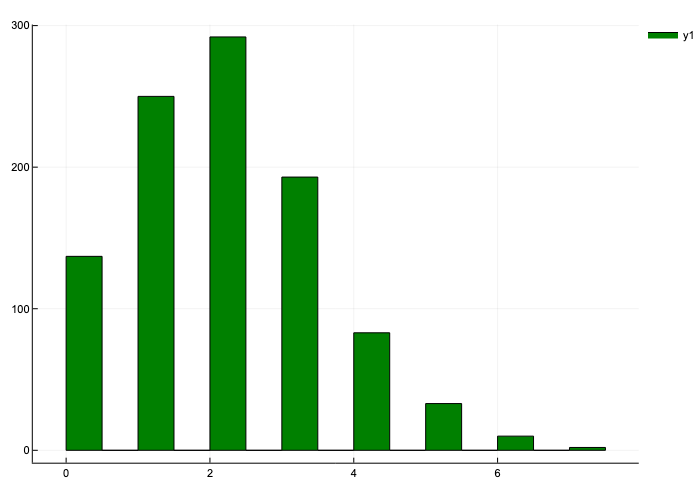

In [36]:
rpois = rand(Poisson(2),1000,)
histogram(rpois, color=:green)

In [37]:
rexp= rand(Exponential(0.5),10)

10-element Vector{Float64}:
 0.2900108628426382
 0.9541558120575122
 0.07174775957765454
 0.5616112074113082
 0.3226689875396419
 0.009687607265121558
 0.06615040976342532
 0.7364990499501683
 0.46091864257119913
 0.20429497999428875

# El problema del cumpleaños
¿Cuáles la probabilidad de que en un grupo de 25 personas no haya dos personas que cumplan años el mismo día? 
Asumiendo año no bisiesto.

In [38]:
m=100000
n=25
y = Array{Int64, 1}(UndefInitializer(), m)
Random.seed!(1234)
for i in 1:m 
b =sample(1:365, n, replace=true)
y[i] = n - length(unique(b))
end
mean( y .== 0)

0.43009

In [39]:
mean(y)

0.80691

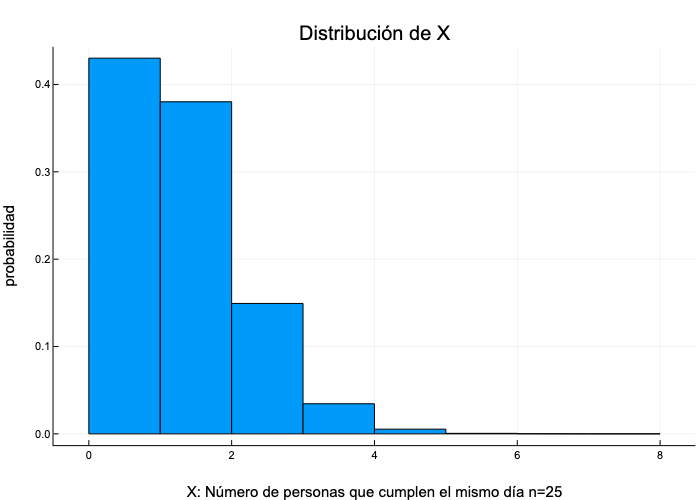

In [40]:
clases = maximum(y)+1
histogram(y, bins=clases, leg=false, normalize= true, ylabel="probabilidad", 
xlabel="X: Número de personas que cumplen el mismo día n=25", title="Distribución de X")

Teóricamente la solución es $\displaystyle\frac{P(365,25)}{365^{25}}=\displaystyle\frac{\frac{365!}{340!}}{365^{25}}=\frac{365.364\cdots341}{365^{25}}=\prod_{i=0}^{24}(1-\frac{i}{365})=0.4313002960305362$

In [41]:
prod([(1-i/365) for i in 0:24 ])

0.4313002960305362

# Integración
Se pueden calcular integrales usando números aleatorios. Dada una función de densidad de probabilidad continua $f(x)$ su valor esperado está dado por 
$$ E(X)=\int_{-\infty}^{\infty}xf(x)\,dx$$ 
y en general
$$ \color{blue}E(g(X))=\int_{-\infty}^{\infty} g(x)f(x)\,dx$$
Suponga que $X=U$ tiene distribución uniforme en $[0,1]$ y que se desea calcular
$$ \theta=\int_0^1g(x)\,dx$$
Para calcular $\theta$, en este caso la función de densidad de $U$ es $f(x)=1$ para $x \in [0,1]$, por lo tanto $\theta=E(g(U))$. Ahora, sean $U_1,U_2,\cdots,U_k$ variables aleatorias con distribución uniforme en $[0,1]$ entonces $g(U_1), g(U_2),\cdots,g(U_k)$ son variables aleatorias con media $\theta$. Es decir,
$$\sum_{i=1}^k\frac{g(U_i)}{k} \to E(g(U))=\theta \quad\text{cuando}\quad k \to \infty$$

La siguiente función calcula $\int_0^1g(x)\,dx$ en Julia


In [42]:
function integral(g,k)
    s=0
for i ∈ 1:k
    u=rand(Uniform())
    s=s+g(u)
end
println(s/k)
end

integral (generic function with 1 method)

## Ejemplo
Hallar $\int_0^1\,e^{e^x}\,dx$

In [43]:
g(x)=exp(exp(x))
integral(g, 10000)

6.3409051433853945


El paquete `QuadGK` de Julia calcula integrales definidas univariadas utilizando la cuadratura de [Gauss_Kronrod](https://en.wikipedia.org/wiki/Gauss–Kronrod_quadrature_formula). La función `quadgk` necesita la función y los límites de integración y retorna el valor de la integral y la tolerancia.

In [44]:
using QuadGK
quadgk(g,0,1)

(6.31656383902768, 2.3935040616152037e-9)

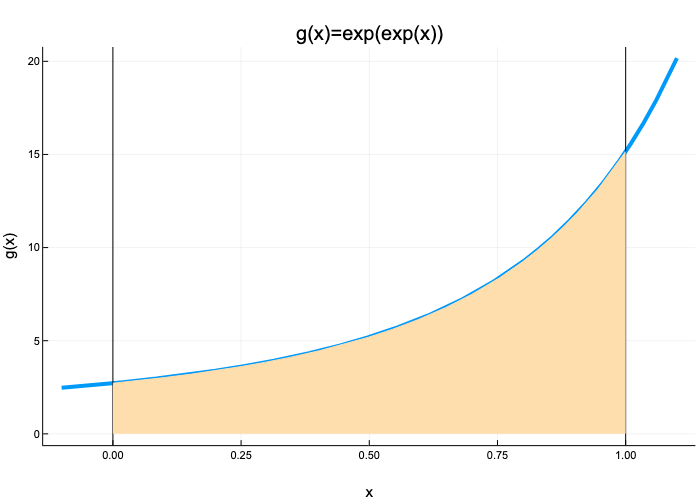

In [45]:
plot(g,-0.1,1.1, leg=false, title="g(x)=exp(exp(x))", lw=4,xlabel="x",ylabel="g(x)")
plot!([0], seriestype = :vline,color=:black)
plot!([1], seriestype = :vline, color=:black)
plot!(g,0,1, fillrange=0, color=:navajowhite)

Si se quiere calcular $\theta=\int_a^bg(x)\,dx$, haga la sustitución
$$ y=\frac{x-a}{b-a}$$
y entonces 
$$dy=\frac{dx}{b-a}$$
y así
$$\theta=\int_0^1 g(a+(b-a)y)(b-a)dy$$
De igual manera si se quiere calcular
$$\theta=\int_0^{\infty}g(x)\,dx$$
haga la sustitución $y=\displaystyle\frac{1}{x+1}$, con  $dy=\displaystyle-\frac{dx}{(x+1)^2}=-y^2dx$, entonces 
$$\theta=\displaystyle\int_0^1 \displaystyle\frac{g(\frac{1}{y}-1)}{y^2}\,dy$$

# Ejemplo
Hallar $\int_0^\infty\displaystyle\frac{x}{(1+x^2)^2}\,dx$
haciendo la sustitución $y=\frac{1}{x+1}$ se obtiene:
$$\theta=\int_0^\infty\displaystyle\frac{x}{(1+x^2)^2}\,dx=\int_0^1 \frac{\frac{1}{y}-1}{y^2(1+(\frac{1}{y}-1)^2)^2} dy$$

In [46]:
h3(y)=((1/y)-1)/(y^2*(1+((1/y)-1)^2)^2)
integral(h3,10000)

0.4999196868689226


Verificamos,

In [47]:
quadgk(x -> x/(1+x^2)^2,0,Inf)

(0.5, 7.357126907692191e-9)

## Integrales múltiples

Supongamos que se quiere calcular
$$ \theta=\int_0^1\int_0^1\cdots\int_0^1 g(x_1,x_2,\dots, x_n)dx_1dx_2\dots \, dx_n$$
para estimar $\theta$, podemos hacerlo mediante
$$ \theta = E(g(U_1,U_2,\dots,U_n))$$
donde las $U_i$ son variables aleatorias con distribución uniforme en (0,1), si se generan $k$ conjuntos de n números aleatorios independientes y uniformes en (0,1):
$$
U_{11},\dots,U_{1n}\\
U_{21},\dots,U_{2n}\\
\vdots\\
U_{k1},\dots,U_{kn}
$$
podemos estimar $\theta$ mediante
$$\frac{1}{k}\sum_{i=1}^k g(U_{1i},U_{2i},\dots,U_{ni})$$

## Ejemplo
Hallar $\int_0^1\int_0^1\displaystyle e^{(x+y)^2}\,dx dy$

In [48]:
function integral2(g,k)
    s=0
for i ∈ 1:k
    u = rand(Uniform())
    v = rand(Uniform())
    s=s+g(u,v)
end
println(s/k)
end

integral2 (generic function with 1 method)

In [49]:
h4(x,y)=exp((x+y)^2)
integral2(h4,1000)

4.8163613863061645


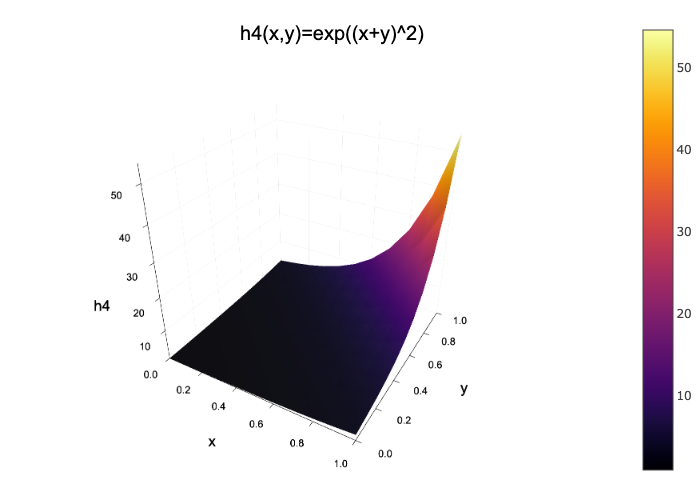

In [50]:
x, y = 0:0.1:1, 0:0.1:1
surface(x,y,h4,title="h4(x,y)=exp((x+y)^2)",xlabel="x",ylabel="y",zlabel="h4")

## Cálculo de variables aleatorias normales

### Antiguo generador

Se generan 12 variables aleatorias con distribución uniforme en $(-\frac{1}{2},\frac{1}{2})$ y sea $Z=\displaystyle\sum_{i=1}^{12}U_i$, en virtud del TLC se tiene la casi normalidad.

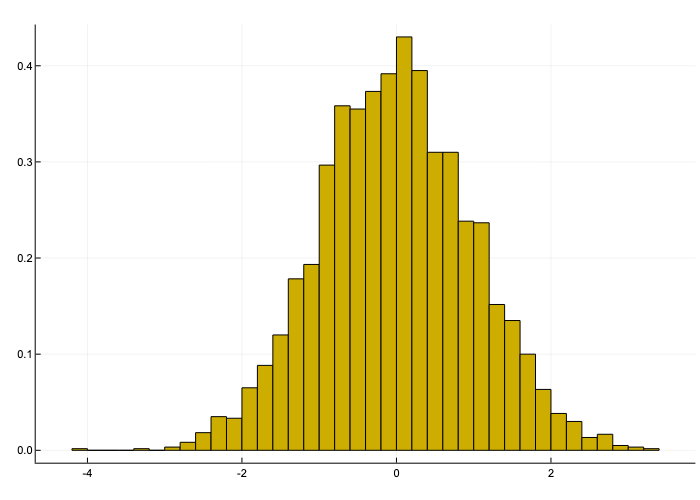

In [51]:
A = rand(Uniform(-.5,.5),(3000,12))
norm1 =sum(A, dims=2)
histogram(norm1, normalize=true, leg=false, color=:gold3)

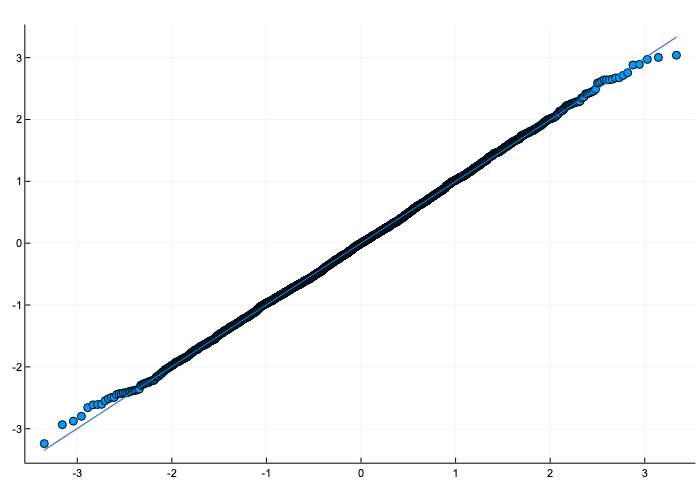

In [52]:
norm1 = vec(norm1)
plot(qqnorm(norm1, smooth = true))


### Algoritmo de Box-Muller

Sean $X$ y $Y$ variables aleatorias normales estándar independientes, sean $R$ y $\Theta$ las coordenadas polares del vector $(X,Y)$, por lo tanto
$$R^2=X^2+Y^2$$
$$\tan \Theta = \frac{Y}{X}$$ 
Como $X$ y $Y$ son independientes su función de densidad conjunta está dada por:
$$f(x,y)=\frac{1}{\sqrt{2\pi}}\,\Large e\normalsize ^{-\displaystyle\frac{x^2}{2}}=\frac{1}{2\pi}\Large e\normalsize^{-\displaystyle\frac{x^2+y^2}{2}}$$

Para hallar la distribución de $R^2$ y $\Theta$, se tiene que
$$R^2=x^2+y^2, \, \Theta=\arctan{\frac{y}{x}}$$
y por lo tanto,
$$f(R^2,\Theta)=\frac{1}{2}\frac{1}{2\pi}\Large e\normalsize^{-\displaystyle\frac{R^2}{2}}$$
que es el producto de una exponencial de parámetro 2 y una distribución uniforme en $(0,2\pi)$.

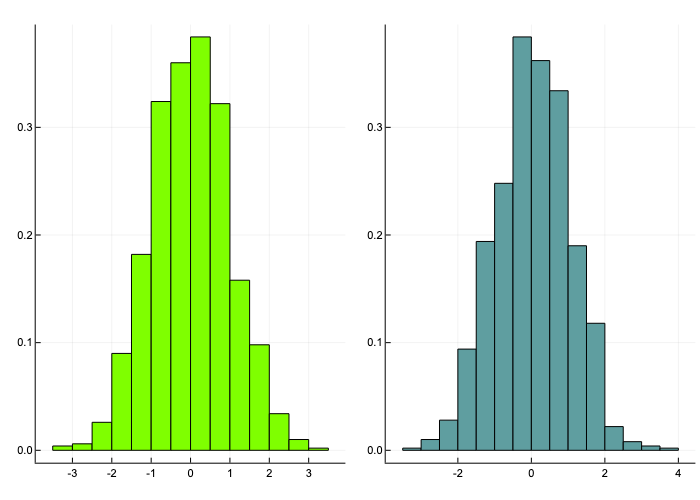

In [53]:
n = 1000
U1 = rand(n)
U2 = rand(n)
R² = -2 .* log.(U1)
Θ = 2 * π .* U2    
X = sqrt.(R²) .* cos.(Θ)
Y =  sqrt.(R²) .* sin.(Θ)
plot(histogram(X,norm=true,color=:chartreuse),histogram(Y,norm=true,color=:cadetblue),layout=(1,2),legend=false)

### Calculo de $P(0<Z<1)$

In [54]:
m=5000
u=rand(m)
h=rand(Uniform(0,0.3989),m)
frac = mean(h .< pdf.(Normal(),u))
0.4*frac

0.3432

In [55]:
u1 = u[h .> pdf.(Normal(),u)]
h1 = h[h .> pdf.(Normal(),u)];

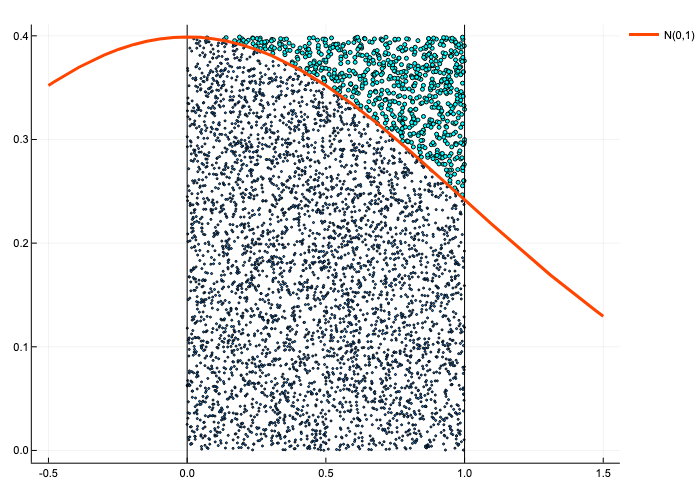

In [56]:
plot(u,h, st=:scatter, color=:dodgerblue, markersize=1,label="")
plot!(u1,h1,st=:scatter, color=:cyan, markersize=2,label="")
plot!([0], seriestype = :vline,color=:black,label="")
plot!([1], seriestype = :vline, color=:black,label="")
plot!(Normal(),-0.5,1.5,lw=3, label="N(0,1)", color=:orangered1)

## Calcular $P( a < Z < b )$ usando números aleatorios normales

In [57]:
m1=50000
a=0
b=1
z=randn(m1)
prob = mean((z .> a ) .+  (z .≤ b) .== 2)

0.34104

In [58]:
prob - (cdf(Normal(),1)-cdf(Normal(),0))

-0.000304746068543027

## Algoritmo de la transformada inversa

### Caso continuo

Sea $U$ una variable aleatoria uniforme en (0,1). Para cualquier función de distribución acumulada $F$ con inversa $F^{-1}$ la variable aleatoria $X$ definida por 
$$ X= F^{-1}(U) $$
entonces $X$ tiene función de distribución acumulada $F$.

## Ejemplo

Sea X una variable aleatoria exponencial de parámetro 1. Es decir, la función de densidad de probabilidad está dada por 
$$ 
\color{blue}
f(x)=
\begin{cases}
e^{-x} & x > 0 \\
0  & x\le0
\end{cases}
$$
la función de distribución acumulada correspondiente está dada por 
$$
u=F_X(x)=
\begin{cases}
0 & x \le 0 \\
1-e^{-x} & x > 0 
\end{cases}
$$
En este caso la función inversa de $F_X(x)$ existe y está dada por
$$ F^{-1}(x)=-\ln(1-u) $$
por lo tanto para generar un número aleatorio exponencial de parámetro 1 se genera un número aleatorio uniforme en (0,1) y hacemos
$$X=-\ln(1-U)$$

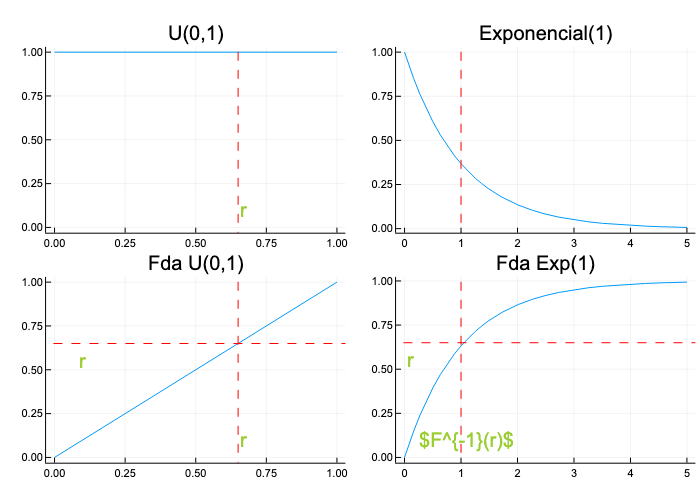

In [59]:
p7 = plot(Uniform(),ylims=[0,1],title="U(0,1)")
vline!([0.65], color=:red, linestyle=:dash)
annotate!(0.67, 0.1, text("r", color=:yellowgreen))
p8 = plot(x -> x,0,1,title="Fda U(0,1)")
vline!([0.65], color=:red, linestyle=:dash)
hline!([0.65], color=:red, linestyle=:dash)
annotate!(0.67, 0.1, text("r", color=:yellowgreen))
annotate!(0.1, 0.55, text("r", color=:yellowgreen))
p9 = plot(Exponential(),0,5,title="Exponencial(1)")
vline!([1], color=:red, linestyle=:dash)
p10 = plot( x -> 1-exp(-x),0,5,title="Fda Exp(1)")
vline!([1], color=:red, linestyle=:dash)
hline!([0.65], color=:red, linestyle=:dash)
annotate!(0.1, 0.55, text("r", color=:yellowgreen))
annotate!(1.1, 0.1, text(L"F^{-1}(r)", color=:yellowgreen))
plot(p7,p9,p8,p10,layout=(2,2),legend = false)

El código a continuación genera 1000 números aleatorios exponenciales por el método de la transformada inversa.

In [60]:
U=rand(1000)
X=-log.(1 .- U);

Las gráficas a continuación son los histogramas de números aleatorios generados por el método de la transformada inversa y con la función `randexp`de julia respectivamente. El primer método no es tan eficiente computacionalmente como el segundo.

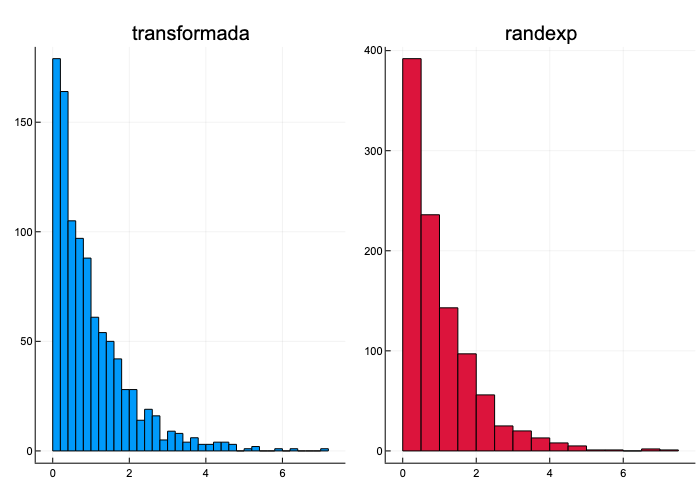

In [61]:
p11 = histogram(X, title="transformada")
p12 = histogram(randexp(1000), color=:crimson, title="randexp")
plot(p11,p12,layout=(1,2),legend=false)

In [62]:
@elapsed X=-log.(1 .- U)

3.1828e-5

In [63]:
@elapsed randexp(1000)

9.236e-6

In [64]:
@which randexp()

randexp() in Random at /Applications/Julia-1.6.app/Contents/Resources/julia/share/julia/stdlib/v1.6/Random/src/normal.jl:119

In [65]:
run(`cal`)

     June 2022        
Su Mo Tu We Th Fr Sa  
          1  2  3  4  
 5  6  7  8  9 10 11  
12 13 14 15 16 17 18  
19 20 21 _2_2 23 24 25  
26 27 28 29 30        
                      


Process(`cal`, ProcessExited(0))

In [66]:
run(`open /Applications/Julia-1.6.app/Contents/Resources/julia/share/julia/stdlib/v1.6/Random/src/normal.jl`)

Process(`open /Applications/Julia-1.6.app/Contents/Resources/julia/share/julia/stdlib/v1.6/Random/src/normal.jl`, ProcessExited(0))

### Caso discreto

Se quiere generar el valor de una variable aleatoria discreta de la forma
$$P(X=x_i)=p_i,\quad i=1,2,\dots, \quad\sum_ip_i=1$$
para esto se puede generar un número aleatorio uniforme en $(0,1), U$ y sea
$$ 
X=
\begin{cases}
x_1 & \text{si}\quad U < p_1\\
x_2 & \text{si}\quad p_1 \le U < p_1 + p_2\\
& \vdots \\
x_i & \text{si}\quad \displaystyle\sum_{j=1}^{i-1} p_j \le U < \sum_{j=1}^{i}p_j\\
& \vdots
\end{cases}
$$

## Ejemplo

Sea 
$$
\color{blue} f(x)= \frac{i}{10}, \quad i=1,2,3,4
$$
En el paquete `Distributions` la función `Categorical` recibe como argumento un vector de probabilidades con suma 1. La gráfica se muestra a continuación

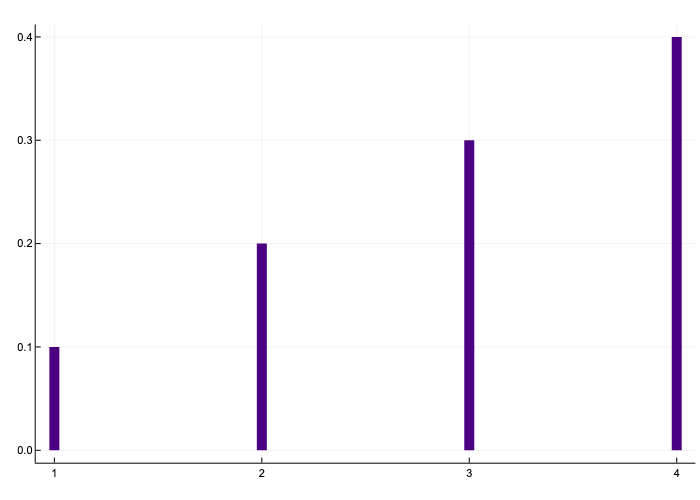

In [67]:
dist1 = Categorical([0.1,0.2,0.3,0.4])
plot(dist1, st=:sticks, lw=10, legend=false,color=:indigo)

In [68]:
nsim = 1000
y = zeros(nsim)
for i in 1:nsim
    u = rand()
    if u < 0.1
        x = 1
        elseif u < 0.3
        x = 2
        elseif u < 0.6
        x = 3
        else 
        x = 4
    end
y[i]=x
end

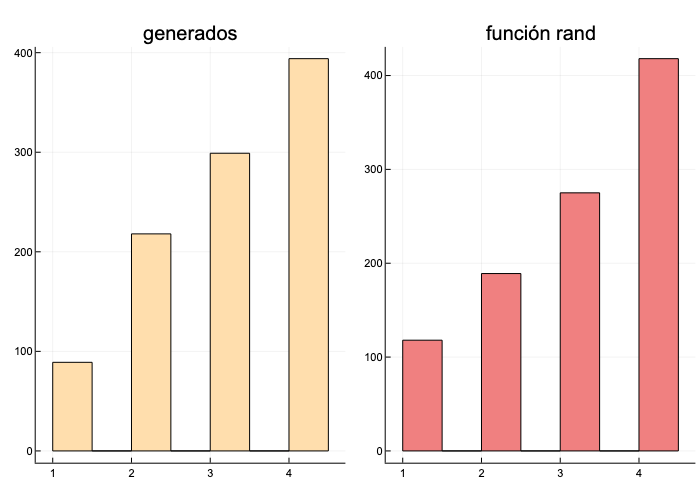

In [69]:
y1 = rand(dist1,nsim);
p13 = histogram(y,title="generados",color=:navajowhite)
p14 = histogram(y1,title="función rand",color=:lightcoral)
plot(p13,p14,layout=(1,2),legend=false)

Vea los colores para las gráficas [aquí](http://juliagraphics.github.io/Colors.jl/stable/namedcolors/)

## Cadena de Markov

Dada la matriz de transición de un paso de una cadena de Markov $w$ para simular como transcurre el proceso estocástico empezando en el estado 1:

In [70]:
nsim=1000000
x=zeros(nsim)
w1=[.18,.274,.426,.120]
w2=[.171,.368,.274,.188]
w3=[.161,.339,.375,.125]
w4=[.079,.355,.384,.182]

w  = vcat(w1',w2',w3',w4')
x[1]=1
for i in 2:nsim
	if x[i-1]==1
		x[i] = wsample(1:4,w1)
	end
	if x[i-1]==2
		x[i] = wsample(1:4,w2)
	end
	if x[i-1]==3
		x[i] = wsample(1:4,w3)
	end
	if x[i-1]==4
		x[i] = wsample(1:4,w4)
	end
end
first(x,10)

10-element Vector{Float64}:
 1.0
 3.0
 4.0
 2.0
 1.0
 4.0
 2.0
 2.0
 2.0
 4.0

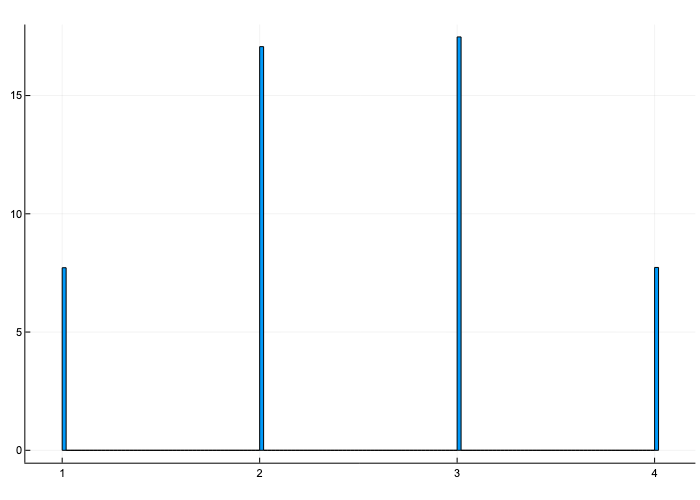

In [71]:
histogram(x,leg=false,normalize=true)

In [72]:
@time w^15

  1.328183 seconds (2.60 M allocations: 138.829 MiB, 3.96% gc time)


4×4 Matrix{Float64}:
 0.155359  0.342808  0.351345  0.155203
 0.15553   0.343184  0.351731  0.155374
 0.15537   0.342831  0.351369  0.155214
 0.155374  0.342839  0.351377  0.155217

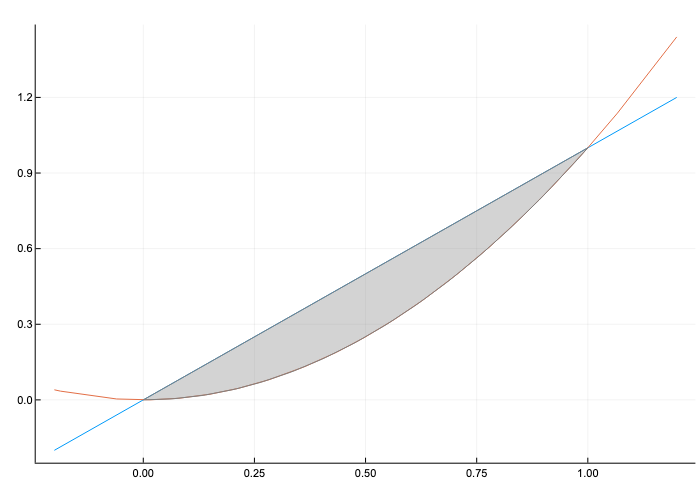

In [73]:
s = collect(0:0.01:1)
h8(x) =  x
h9(x) = x^2
plot(h8,-0.2,1.2,leg=false)
plot!(h9,-0.2,1.2,leg=false)
plot!(s, h8, fillrange=h9, fillalpha=0.35, color=:grey)

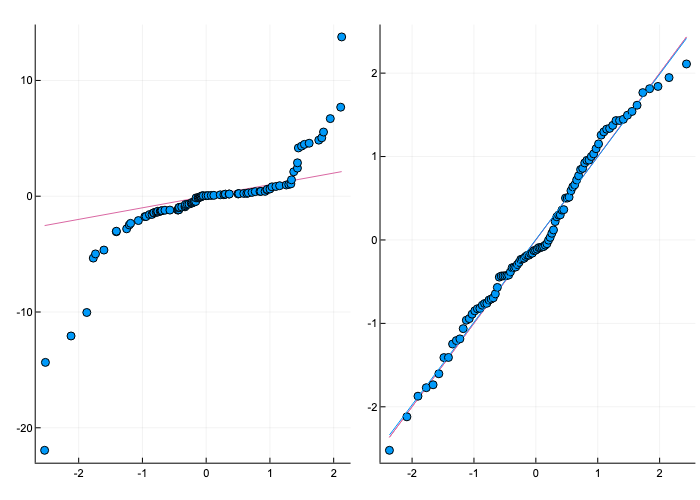

In [74]:
x = rand(Normal(), 100) 
y = rand(Cauchy(), 100)
plot(
    qqplot(x, y),
    qqnorm(x, smooth = true)
)